In [1]:
import pandas as pd
import numpy as np
from scipy.interpolate import interp1d
import csv
import matplotlib.pyplot as plt
import warnings
import matplotlib
import seaborn as sns
warnings.filterwarnings("ignore")


In [2]:
df = pd.read_csv("data.csv",low_memory = False)
df

,Date,Station,Source,Depth,YSI_Depth,YSI_Temp,YSI_Salinity,YSI_DO,YSI_Turbidity,YSI_Chl,...,CtoN,DOC,DIC,NO3/NO2,NH4,DIN,TDN,DON,PO4,SiO2
0,2000/1/6,0,IMS,2,4.000,10.93,0.10,9.36,-7777.0,-7777.0,...,6.90,441.8,-7777.000000,779.296051,57.007864,836.303915,1320.963257,485.0,-9999.00000,96.903763
1,2000/1/6,0,IMS,1,0.100,11.15,0.10,9.64,-7777.0,-7777.0,...,5.46,439.4,4.870467,776.528748,59.663273,836.192021,1314.189941,478.0,-9999.00000,93.920674
2,2000/1/6,10,IMS,2,3.000,10.59,0.10,9.50,-7777.0,-7777.0,...,8.01,-7777.0,-7777.000000,769.291901,66.964248,836.256149,-7777.000000,-2222.0,-9999.00000,98.343296
3,2000/1/6,10,IMS,1,0.100,10.97,0.10,9.74,-7777.0,-7777.0,...,7.40,-7777.0,5.074685,775.346496,65.562847,840.909343,-7777.000000,-2222.0,-9999.00000,95.093953
4,2000/1/6,20,IMS,2,2.500,10.54,0.10,9.75,-7777.0,-7777.0,...,7.11,-7777.0,-7777.000000,778.716033,75.779327,854.495360,1342.243408,488.0,4.62645,115.384312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9962,2019/7/9,140,IMS,2,5.080,28.28,24.87,0.71,2.5,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9963,2019/7/9,160,IMS,1,0.300,28.69,16.41,6.93,1.2,4.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9964,2019/7/9,160,IMS,2,7.022,28.27,27.31,0.86,5.6,3.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9965,2019/7/9,180,IMS,1,0.373,28.62,17.90,6.44,0.7,3.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
#df = df.replace(np.nan,-1)
df = df.replace("#REF!",np.nan)
df = df.replace(" ",np.nan)
df = df.replace('#DIV/0!',np.nan)
df = df.replace('#VALUE!',np.nan)
for i in range(1,9):
    df = df.replace(i*(-1111),np.nan)
df = df.replace(-9999,0)
df

,Date,Station,Source,Depth,YSI_Depth,YSI_Temp,YSI_Salinity,YSI_DO,YSI_Turbidity,YSI_Chl,...,CtoN,DOC,DIC,NO3/NO2,NH4,DIN,TDN,DON,PO4,SiO2
0,2000/1/6,0,IMS,2,4.000,10.93,0.10,9.36,NaN,NaN,...,6.90,441.8,NaN,779.296051,57.007864,836.303915,1320.963257,485.0,0.00000,96.903763
1,2000/1/6,0,IMS,1,0.100,11.15,0.10,9.64,NaN,NaN,...,5.46,439.4,4.870467,776.528748,59.663273,836.192021,1314.189941,478.0,0.00000,93.920674
2,2000/1/6,10,IMS,2,3.000,10.59,0.10,9.50,NaN,NaN,...,8.01,NaN,NaN,769.291901,66.964248,836.256149,NaN,NaN,0.00000,98.343296
3,2000/1/6,10,IMS,1,0.100,10.97,0.10,9.74,NaN,NaN,...,7.40,NaN,5.074685,775.346496,65.562847,840.909343,NaN,NaN,0.00000,95.093953
4,2000/1/6,20,IMS,2,2.500,10.54,0.10,9.75,NaN,NaN,...,7.11,NaN,NaN,778.716033,75.779327,854.495360,1342.243408,488.0,4.62645,115.384312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9962,2019/7/9,140,IMS,2,5.080,28.28,24.87,0.71,2.5,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9963,2019/7/9,160,IMS,1,0.300,28.69,16.41,6.93,1.2,4.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9964,2019/7/9,160,IMS,2,7.022,28.27,27.31,0.86,5.6,3.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9965,2019/7/9,180,IMS,1,0.373,28.62,17.90,6.44,0.7,3.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
data = df.iloc[:,[0,1,3,7]]
data.Date = pd.to_datetime(data.Date,format='%Y/%m/%d')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9967 entries, 0 to 9966
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     9967 non-null   datetime64[ns]
 1   Station  9967 non-null   object        
 2   Depth    9967 non-null   object        
 3   YSI_DO   9896 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 311.6+ KB


In [5]:
data = data.drop(data[data['Station']=='Neuse River at Kinston'].index)
data = data.drop(data[data['Station']=='Streets Ferry Bridge'].index)
data = data.drop(data[data['Station']=='Fisher Landing'].index)
data = data.drop(data[data['Station']=='Camp Seafarer'].index)
data = data.drop(data[data['Station']=='Union Point Neuse'].index)
data = data.drop(data[data['Station']=='Union Point Trent'].index)
data = data.drop(data[data['Station']=='4'].index)
data = data.drop(data[data['Station']=='95'].index)
data = data.drop(data[data['Station']=='96'].index)
data = data.drop(data[data['Station']=='165'].index)
data = data.drop(data[data['Station']=='10'].index)
data = data.drop(data[data['Station']=='130'].index)

data['Depth'].replace(['21D', '11D'], ['2', '1'],inplace=True)
data.drop(index=data[data['Depth']=='1.0 m'].index[0],inplace=True)



## 1. Wind data with 8 direction

In [6]:
N = pd.read_excel('daily_weather_revised4_final.xlsx',sheet_name = 'N')
NE = pd.read_excel('daily_weather_revised4_final.xlsx',sheet_name = 'NE')
E = pd.read_excel('daily_weather_revised4_final.xlsx',sheet_name = 'E')
SE = pd.read_excel('daily_weather_revised4_final.xlsx',sheet_name = 'SE')
S = pd.read_excel('daily_weather_revised4_final.xlsx',sheet_name = 'S')
SW = pd.read_excel('daily_weather_revised4_final.xlsx',sheet_name = 'SW')
W = pd.read_excel('daily_weather_revised4_final.xlsx',sheet_name = 'W')
NW = pd.read_excel('daily_weather_revised4_final.xlsx',sheet_name = 'NW')



In [7]:
wind_data_list = [N,NE,E,SE,S,SW,W,NW]

for df in wind_data_list:
    df = df.replace("#REF!",np.nan)
    df = df.replace(" ",np.nan)
    df = df.replace('#DIV/0!',np.nan)
    df = df.replace('#VALUE!',np.nan)
    
wind_data_list[0]

,Date,WDIR,WSPD,Direction,N1,N2,N3,N4,N5,N6,N7,N8,N9,N10,N11,N12,N13,N14
0,1994-01-01,99.758500,32.118315,E,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1994-01-02,-146.102148,19.845997,SW,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,1994-01-03,23.593427,182.739437,NE,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,1994-01-04,-110.676445,171.554865,W,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,1994-01-05,-69.976572,166.413322,W,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9491,2019-12-27,34.585453,76.919609,NE,0.0,88.751665,268.664037,268.664037,268.664037,397.220289,544.636402,640.534609,805.700035,966.397813,966.397813,966.397813,966.397813,966.397813
9492,2019-12-28,65.990199,25.115931,NE,0.0,0.000000,88.751665,268.664037,268.664037,268.664037,397.220289,544.636402,640.534609,805.700035,966.397813,966.397813,966.397813,966.397813
9493,2019-12-29,98.904417,39.643576,E,0.0,0.000000,0.000000,88.751665,268.664037,268.664037,268.664037,397.220289,544.636402,640.534609,805.700035,966.397813,966.397813,966.397813
9494,2019-12-30,-160.838368,154.653095,S,0.0,0.000000,0.000000,0.000000,88.751665,268.664037,268.664037,268.664037,397.220289,544.636402,640.534609,805.700035,966.397813,966.397813


In [8]:
data.Date = pd.to_datetime(data.Date,format='%Y/%m/%d')
for i,df in enumerate(wind_data_list):
    wind_data_list[i] = pd.merge(data,df,how='left',on='Date')
    
wind_data_list[0]

,Date,Station,Depth,YSI_DO,WDIR,WSPD,Direction,N1,N2,N3,...,N5,N6,N7,N8,N9,N10,N11,N12,N13,N14
0,2000-01-06,0,2,9.36,27.917564,171.114160,NE,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,63.372212,63.372212,63.372212,295.338235,408.463114
1,2000-01-06,0,1,9.64,27.917564,171.114160,NE,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,63.372212,63.372212,63.372212,295.338235,408.463114
2,2000-01-06,20,2,9.75,27.917564,171.114160,NE,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,63.372212,63.372212,63.372212,295.338235,408.463114
3,2000-01-06,20,1,10.21,27.917564,171.114160,NE,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,63.372212,63.372212,63.372212,295.338235,408.463114
4,2000-01-06,30,2,10.08,27.917564,171.114160,NE,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,63.372212,63.372212,63.372212,295.338235,408.463114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9647,2019-07-09,140,2,0.71,34.618412,82.377246,NE,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,10.908175
9648,2019-07-09,160,1,6.93,34.618412,82.377246,NE,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,10.908175
9649,2019-07-09,160,2,0.86,34.618412,82.377246,NE,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,10.908175
9650,2019-07-09,180,1,6.44,34.618412,82.377246,NE,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,10.908175


## 2. subsetting

In [9]:

def subsetting(data):

    groups = data.groupby(data.Station)
    sta0 = groups.get_group("0")
    sta20 = groups.get_group("20")
    sta30 = groups.get_group("30")
    sta50 = groups.get_group("50")
    sta60 = groups.get_group("60")
    sta70 = groups.get_group("70")
    sta100 = groups.get_group("100")
    sta120 = groups.get_group("120")
    sta140 = groups.get_group("140")
    sta160 = groups.get_group("160")
    sta180 = groups.get_group("180")

    groupsDepth0 = sta0.groupby(sta0.Depth)
    groupsDepth20 = sta20.groupby(sta20.Depth)
    groupsDepth30 = sta30.groupby(sta30.Depth)
    groupsDepth50 = sta50.groupby(sta50.Depth)
    groupsDepth60 = sta60.groupby(sta60.Depth)
    groupsDepth70 = sta70.groupby(sta70.Depth)
    groupsDepth100 = sta100.groupby(sta100.Depth)
    groupsDepth120 = sta120.groupby(sta120.Depth)
    groupsDepth140 = sta140.groupby(sta140.Depth)
    groupsDepth160 = sta160.groupby(sta160.Depth)
    groupsDepth180 = sta180.groupby(sta180.Depth)

# each station comprises of depth 1 and 2，
# which makes 11 * 2 = 22 subsets
    sta0_1 = groupsDepth0.get_group('1')
    sta0_2 = groupsDepth0.get_group('2')
    sta20_1 = groupsDepth20.get_group('1')
    sta20_2 = groupsDepth20.get_group('2')
    sta30_1 = groupsDepth30.get_group('1')
    sta30_2 = groupsDepth30.get_group('2')
    sta50_1 = groupsDepth50.get_group('1')
    sta50_2 = groupsDepth50.get_group('2')
    sta60_1 = groupsDepth60.get_group('1')
    sta60_2 = groupsDepth60.get_group('2')
    sta70_1 = groupsDepth70.get_group('1')
    sta70_2 = groupsDepth70.get_group('2')
    sta100_1 = groupsDepth100.get_group('1')
    sta100_2 = groupsDepth100.get_group('2')
    sta120_1 = groupsDepth120.get_group('1')
    sta120_2 = groupsDepth120.get_group('2')
    sta140_1 = groupsDepth140.get_group('1')
    sta140_2 = groupsDepth140.get_group('2')
    sta160_1 = groupsDepth160.get_group('1')
    sta160_2 = groupsDepth160.get_group('2')
    sta180_1 = groupsDepth180.get_group('1')
    sta180_2 = groupsDepth180.get_group('2')
    station_depth_df = [sta0_1,sta0_2
,sta20_1
,sta20_2
,sta30_1 
,sta30_2
,sta50_1
,sta50_2
,sta60_1
,sta60_2
,sta70_1 
,sta70_2
,sta100_1
,sta100_2
,sta120_1
,sta120_2
,sta140_1
,sta140_2
,sta160_1
,sta160_2
,sta180_1
,sta180_2]
    return station_depth_df

In [10]:
station_depth_df = subsetting(data)
# station_depth_df_test = subsetting(data_test)
# station_depth_df_test[0].Date
station_depth_df[0]

,Date,Station,Depth,YSI_DO
1,2000-01-06,0,1,9.64
27,2000-02-01,0,1,12.26
55,2000-02-09,0,1,11.23
82,2000-02-29,0,1,9.05
111,2000-03-14,0,1,7.70
...,...,...,...,...
9857,2019-05-07,0,1,5.20
9879,2019-05-21,0,1,6.66
9901,2019-06-04,0,1,7.68
9923,2019-06-17,0,1,6.10


In [11]:
wind_data_list[0].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9652 entries, 0 to 9651
Data columns (total 21 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       9652 non-null   datetime64[ns]
 1   Station    9652 non-null   object        
 2   Depth      9652 non-null   object        
 3   YSI_DO     9590 non-null   float64       
 4   WDIR       9652 non-null   float64       
 5   WSPD       9652 non-null   float64       
 6   Direction  9652 non-null   object        
 7   N1         9652 non-null   float64       
 8   N2         9652 non-null   float64       
 9   N3         9652 non-null   float64       
 10  N4         9652 non-null   float64       
 11  N5         9652 non-null   float64       
 12  N6         9652 non-null   float64       
 13  N7         9652 non-null   float64       
 14  N8         9652 non-null   float64       
 15  N9         9652 non-null   float64       
 16  N10        9652 non-null   float64       


In [12]:
for i, df in enumerate(wind_data_list):
    wind_data_list[i]['Direction'] = pd.to_numeric(wind_data_list[i]['Direction'], errors='coerce')
wind_data_list[7] = wind_data_list[7].drop(columns=['Unnamed: 18', 'Unnamed: 19'], axis=1)

In [13]:
wind_data_list[7].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9652 entries, 0 to 9651
Data columns (total 21 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       9652 non-null   datetime64[ns]
 1   Station    9652 non-null   object        
 2   Depth      9652 non-null   object        
 3   YSI_DO     9590 non-null   float64       
 4   WDIR       9652 non-null   float64       
 5   WSPD       9652 non-null   float64       
 6   Direction  0 non-null      float64       
 7   NW1        9652 non-null   float64       
 8   NW2        9652 non-null   float64       
 9   NW3        9652 non-null   float64       
 10  NW4        9652 non-null   float64       
 11  NW5        9652 non-null   float64       
 12  NW6        9652 non-null   float64       
 13  NW7        9652 non-null   float64       
 14  NW8        9652 non-null   float64       
 15  NW9        9652 non-null   float64       
 16  NW10       9652 non-null   float64       


## 3. test if subset has different corraltion

In [14]:
temp = wind_data_list[0]
temp = temp.set_index('Date')
# temp['2015']

for i,df in enumerate(wind_data_list):
     wind_data_list[i] = wind_data_list[i].set_index('Date')

## 4. Correlation

In [18]:
wind_list_test = wind_data_list
# for i,df in enumerate(wind_list_test):
#     wind_list_test[i] = pd.merge(station_depth_df[0],df,how='left',on='Date')
    
# wind_list_test[0]
#for i,df in enumerate(wind_list_test):
    #wind_list_test[i] = wind_list_test[i].set_index('Date')

import seaborn as sns
fig = plt.figure(figsize=(40, 30),dpi=600)
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    sns.heatmap(data=wind_list_test[i]['2000':'2015'].drop(columns=['WDIR','WSPD','Direction','Station','Depth']).corr(),vmax=0.5,annot=True,fmt='.3f')
    
    plt.subplot(4,2,i+2)
    sns.heatmap(data=wind_list_test[i+1]['2000':'2015'].drop(columns=['WDIR','WSPD','Direction','Station','Depth']).corr(),vmax=0.5,annot=True,fmt='.3f')

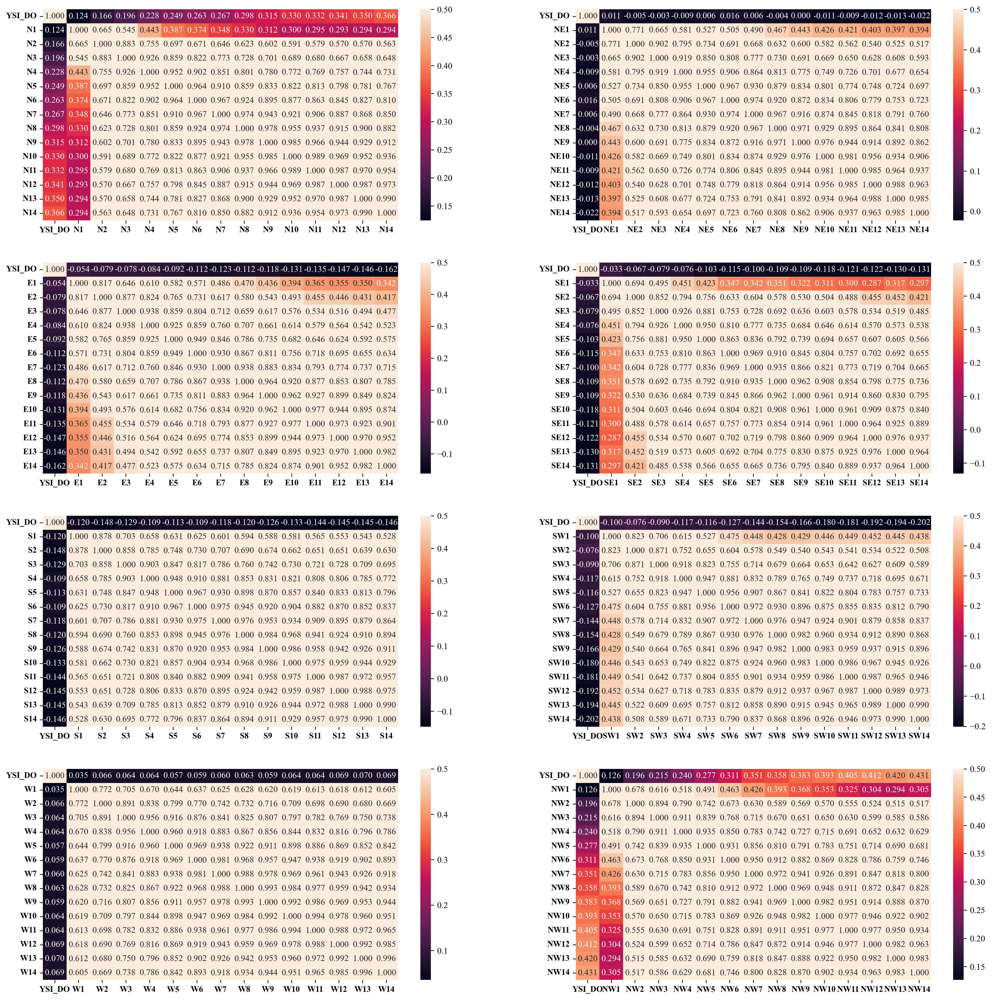

In [22]:
matplotlib.rcParams['font.family'] = 'serif'
matplotlib.rcParams['font.serif'] = ['Times New Roman'] + matplotlib.rcParams['font.serif']

fig = plt.figure(figsize=(20, 20), dpi=300)

for i in range(0, 8, 2):
    ax1 = plt.subplot(4, 2, i + 1)
    sns.heatmap(data=wind_list_test[i]['2000':'2015'].drop(columns=['WDIR', 'WSPD', 'Direction', 'Station', 'Depth']).corr(),
                vmax=0.5, annot=True, fmt='.3f', ax=ax1, annot_kws={"fontsize": 10})  
    
    ax1.set_xticklabels(ax1.get_xticklabels(), fontsize=9.50, fontweight='bold', rotation=0) 
    ax1.set_yticklabels(ax1.get_yticklabels(), fontsize=9.50, fontweight='bold')

    ax2 = plt.subplot(4, 2, i + 2)
    sns.heatmap(data=wind_list_test[i + 1]['2000':'2015'].drop(columns=['WDIR', 'WSPD', 'Direction', 'Station', 'Depth']).corr(),
                vmax=0.5, annot=True, fmt='.3f', ax=ax2, annot_kws={"fontsize": 10}) 
 
    ax2.set_xticklabels(ax2.get_xticklabels(), fontsize=9.50, fontweight='bold', rotation=0)  
    ax2.set_yticklabels(ax2.get_yticklabels(), fontsize=9.50, fontweight='bold')

#plt.savefig('...\figure.png', dpi=800)    
plt.show()